In [1]:
#MRI Brain Tumor Dataset

link: https://www.kaggle.com/datasets/navoneel/brain-mri-images-for-brain-tumor-detection

In [2]:
#import packages

In [1]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import glob
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score
import random
import cv2
import sys
import torch.nn as nn
import torch.nn.functional as F
import seaborn as sns

In [4]:
#Reading MRI Images

In [2]:
malignant = []
benign = []
for f in glob.iglob("./data/brain_tumor_dataset/yes/*.[jJ][pP][gG]"):
    img = cv2.imread(f)
    img = cv2.resize(img,(128,128))
    b, g, r = cv2.split(img)
    img = cv2.merge([r,g,b])
    malignant.append(img)

for f in glob.iglob("./data/brain_tumor_dataset/no/*.[jJ][pP][gG]"):
    img = cv2.imread(f)
    img = cv2.resize(img,(128,128)) 
    b, g, r = cv2.split(img)
    img = cv2.merge([r,g,b])
    benign.append(img)

In [3]:
malignant = np.array(malignant)
benign = np.array(benign)
combined = np.concatenate((benign, malignant))

In [4]:
malignant.shape

(154, 128, 128, 3)

In [5]:
benign.shape

(91, 128, 128, 3)

In [6]:
np.random.choice(10, 5, replace=False)

array([6, 9, 5, 4, 0])

In [7]:
#Visualizing MRI Images (Images shown below are not trained, so they are not accurate)

In [8]:
def plot_all(benign, malignant, cols=5):
    def plot_category(images, title):
        num_images = len(images)
        rows = (num_images + cols - 1) // cols

        plt.figure(figsize=(16, 2 * rows)) 
        for i, img in enumerate(images, 1):
            plt.subplot(rows, cols, i)
            plt.imshow(img)
            plt.title(title)
            plt.axis('off')
        plt.tight_layout()
        plt.show()

    # Plot benign images
    plot_category(benign, "Safe")

    # Plot malignant images
    plot_category(malignant, "Tumor")

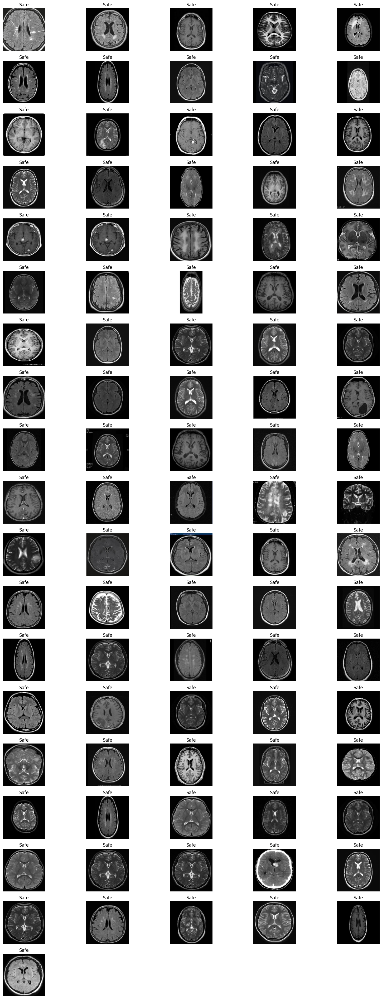

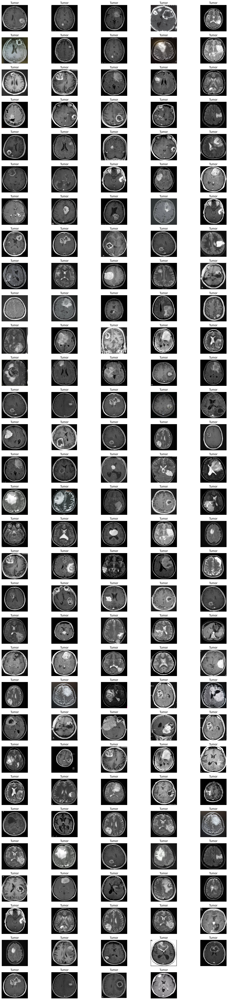

In [9]:
plot_all(benign, malignant)

In [10]:
#Pytorch's Abstract Dataset Class

In [11]:
class Dataset(object):
    """An abstract class representing a Dataset.

    All other datasets should subclass it. All subclasses should override
    ``__len__``, that provides the size of the dataset, and ``__getitem__``,
    supporting integer indexing in range from 0 to len(self) exclusive.
    """

    def __getitem__(self, index):
        raise NotImplementedError

    def __len__(self):
        raise NotImplementedError

    def __add__(self, other):
        return ConcatDataset([self, other])

In [12]:
IMAGE_SIZE = (128, 128)

def load_and_process_image(file_path):
    """
    Load and preprocess an image.
    """
    try:
        img = cv2.imread(file_path)
        img = cv2.resize(img, IMAGE_SIZE)
        b, g, r = cv2.split(img)
        img = cv2.merge([r, g, b])
        img = img.reshape((img.shape[2], img.shape[0], img.shape[1]))
        return img
    except Exception as e:
        print(f"Error loading image {file_path}: {e}")
        return None

class MRI(Dataset):
    """
    Custom Dataset class for MRI images.
    """
    def __init__(self):
        tumor = [load_and_process_image(f) for f in glob.iglob("./data/brain_tumor_dataset/yes/*.[jJ][pP][gG]")]
        safe = [load_and_process_image(f) for f in glob.iglob("./data/brain_tumor_dataset/no/*.[jJ][pP][gG]")]
        
        tumor = np.array([img for img in tumor if img is not None], dtype=np.float32)
        safe = np.array([img for img in safe if img is not None], dtype=np.float32)
        
        tumor_label = np.ones(tumor.shape[0], dtype=np.float32)
        safe_label = np.zeros(safe.shape[0], dtype=np.float32)
        
        self.images = np.concatenate((tumor, safe), axis=0)
        self.labels = np.concatenate((tumor_label, safe_label))

    def __len__(self):
        return self.images.shape[0]
    
    def __getitem__(self, index):
        sample = {'image': self.images[index], 'label': self.labels[index]}
        return sample
    
    def normalize(self):
        self.images = self.images / 255.0

In [13]:
mri_dataset = MRI()
mri_dataset.normalize()

In [14]:
#dataloader

In [47]:
names = {0: 'Safe', 1: 'Tumor'}
dataloader = DataLoader(mri_dataset, shuffle=True)

# for i, sample in enumerate(dataloader):
#     img = sample['image'].squeeze()
#     img = img.reshape((img.shape[1], img.shape[2], img.shape[0]))
#     plt.title(names[sample['label'].item()])
#     plt.imshow(img)
#     plt.show()

In [16]:
#creating model

In [17]:
import torch.nn as nn
import torch.nn.functional as F

class CNN(nn.Module):
    def __init__(self):
        super(CNN,self).__init__()
        self.cnn_model = nn.Sequential(
        nn.Conv2d(in_channels=3, out_channels=6, kernel_size=5),
        nn.Tanh(),
        nn.AvgPool2d(kernel_size=2, stride=5),
        nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5),
        nn.Tanh(),
        nn.AvgPool2d(kernel_size=2, stride=5))
        
        self.fc_model = nn.Sequential(
        nn.Linear(in_features=256, out_features=120),
        nn.Tanh(),
        nn.Linear(in_features=120, out_features=84),
        nn.Tanh(),
        nn.Linear(in_features=84, out_features=1))
        
    def forward(self, x):
        x = self.cnn_model(x)
        x = x.view(x.size(0), -1)
        x = self.fc_model(x)
        x = F.sigmoid(x)
        
        return x
            

In [18]:
model = CNN()

In [19]:
model

CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [20]:
model.cnn_model[0].weight

Parameter containing:
tensor([[[[ 0.0421, -0.0716, -0.0500,  0.0909,  0.0891],
          [ 0.0667, -0.0366, -0.1017, -0.0675,  0.0312],
          [ 0.0953,  0.0335,  0.0556,  0.0516,  0.0714],
          [ 0.0951,  0.0982,  0.0928, -0.0269,  0.0116],
          [ 0.0350, -0.0191,  0.0634,  0.0735,  0.0509]],

         [[ 0.0437,  0.0780,  0.0119, -0.0657, -0.0471],
          [-0.0016,  0.0642, -0.1023,  0.0409, -0.0060],
          [-0.0898,  0.0023,  0.0335, -0.0208, -0.1005],
          [-0.0029, -0.0763, -0.0349,  0.0707,  0.0830],
          [ 0.0608, -0.0070,  0.0298,  0.0491,  0.0244]],

         [[-0.0825, -0.0773, -0.0281, -0.0648,  0.0212],
          [ 0.0354, -0.0043, -0.0588, -0.0057,  0.1032],
          [-0.0588, -0.0721, -0.0029, -0.1115, -0.0094],
          [-0.0308, -0.0278,  0.0056,  0.0813, -0.1028],
          [ 0.0339, -0.0491,  0.0176,  0.0788,  0.1074]]],


        [[[-0.0728,  0.0320, -0.0379, -0.0178, -0.0328],
          [ 0.0440, -0.0533,  0.0685, -0.0250,  0.0736],
 

In [21]:
model.cnn_model[0].weight.shape

torch.Size([6, 3, 5, 5])

In [22]:
model.cnn_model[0].weight[0][1]

tensor([[ 0.0437,  0.0780,  0.0119, -0.0657, -0.0471],
        [-0.0016,  0.0642, -0.1023,  0.0409, -0.0060],
        [-0.0898,  0.0023,  0.0335, -0.0208, -0.1005],
        [-0.0029, -0.0763, -0.0349,  0.0707,  0.0830],
        [ 0.0608, -0.0070,  0.0298,  0.0491,  0.0244]],
       grad_fn=<SelectBackward0>)

In [23]:
#Linear Layer

In [24]:
model.fc_model

Sequential(
  (0): Linear(in_features=256, out_features=120, bias=True)
  (1): Tanh()
  (2): Linear(in_features=120, out_features=84, bias=True)
  (3): Tanh()
  (4): Linear(in_features=84, out_features=1, bias=True)
)

In [25]:
model.fc_model[0]

Linear(in_features=256, out_features=120, bias=True)

In [26]:
model.fc_model[0].weight

Parameter containing:
tensor([[ 0.0273,  0.0056, -0.0204,  ..., -0.0537, -0.0373,  0.0251],
        [ 0.0162, -0.0360,  0.0199,  ..., -0.0532, -0.0216,  0.0220],
        [ 0.0421,  0.0451, -0.0443,  ..., -0.0293,  0.0588, -0.0253],
        ...,
        [-0.0547, -0.0543,  0.0416,  ..., -0.0468, -0.0014,  0.0522],
        [-0.0019,  0.0324, -0.0216,  ...,  0.0295,  0.0124,  0.0576],
        [ 0.0121, -0.0508,  0.0071,  ...,  0.0317,  0.0316,  0.0323]],
       requires_grad=True)

In [27]:
model.fc_model[0].weight.shape

torch.Size([120, 256])

In [28]:
#Evaluating a New Neural Network

In [29]:
mri_dataset = MRI()
mri_dataset.normalize()
model = CNN()

dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=False)

In [30]:
model.eval()
dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=False)
outputs=[]
y_true = []
with torch.no_grad():
    for D in dataloader:
        image =  D['image']
        label = D['label']
        
        y_hat = model(image)
        
        outputs.append(y_hat.cpu().detach().numpy())
        y_true.append(label.cpu().detach().numpy())

In [31]:
outputs = np.concatenate( outputs, axis=0 ).squeeze()
y_true = np.concatenate( y_true, axis=0 ).squeeze()

In [32]:
def threshold(scores,threshold=0.50, minimum=0, maximum = 1.0):
    x = np.array(list(scores))
    x[x >= threshold] = maximum
    x[x < threshold] = minimum
    return x

In [33]:
#Training the model

In [34]:
eta = 0.0001
EPOCH = 400
optimizer = torch.optim.Adam(model.parameters(), lr=eta)
dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=True)
model.train()

CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [35]:
for epoch in range(1, EPOCH):
    losses = []
    for D in dataloader:
        optimizer.zero_grad()
        data = D['image']
        label = D['label']
        y_hat = model(data)
        error = nn.BCELoss() 
        loss = torch.sum(error(y_hat.squeeze(), label))
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

In [36]:
#Evaluating and testing accuracy

In [37]:
model.eval()
dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=False)
outputs=[]
y_true = []
with torch.no_grad():
    for D in dataloader:
        image =  D['image']
        label = D['label']
        
        y_hat = model(image)
        
        outputs.append(y_hat.cpu().detach().numpy())
        y_true.append(label.cpu().detach().numpy())
        
outputs = np.concatenate( outputs, axis=0 )
y_true = np.concatenate( y_true, axis=0 )

In [46]:
accuracy = accuracy_score(y_true, threshold(outputs))
final_accuracy = accuracy * 100
print(f"Accuracy: {final_accuracy:.2f}%")

Accuracy: 100.00%


In [39]:
#confusion matrix

[Text(0, 0.5, 'malignant'), Text(0, 1.5, 'Benign')]

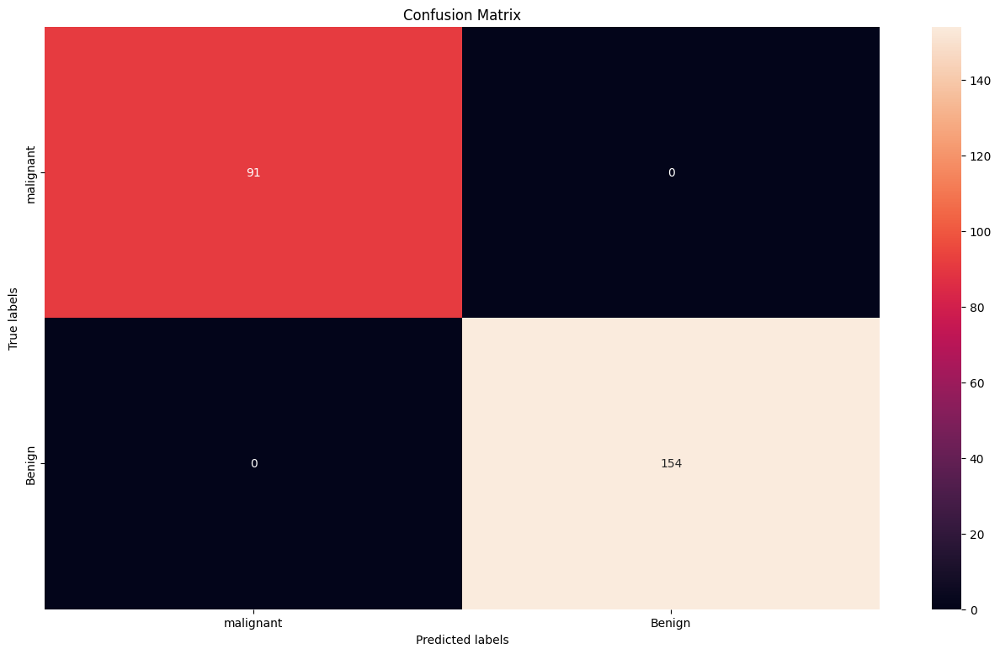

In [40]:
cm = confusion_matrix(y_true, threshold(outputs))
plt.figure(figsize=(16,9))

ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax);

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['malignant','Benign'])
ax.yaxis.set_ticklabels(['malignant','Benign'])

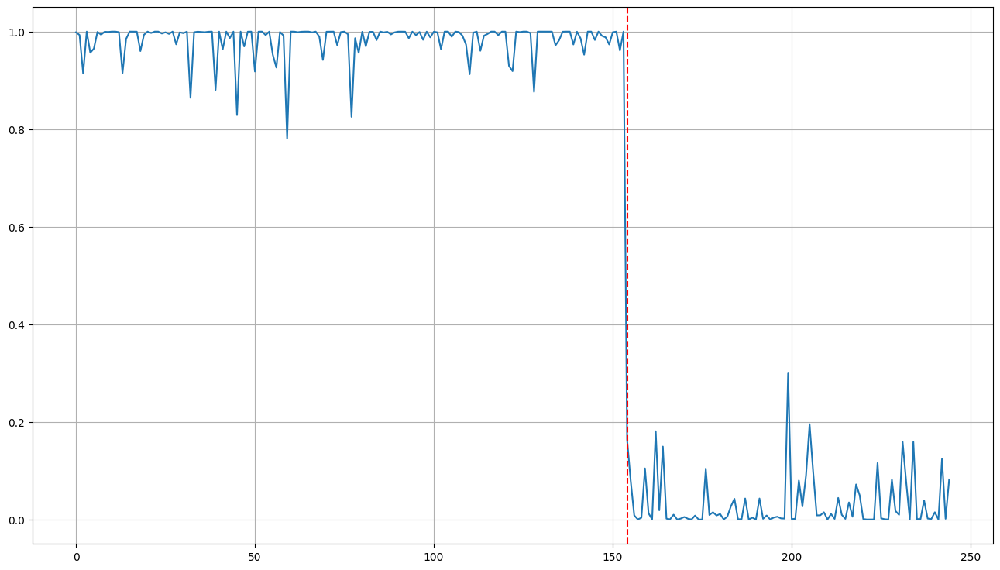

In [41]:
plt.figure(figsize=(16,9))
plt.plot(outputs)
plt.axvline(x=len(malignant), color='r', linestyle='--')
plt.grid()

In [42]:
#Visualizing MRI Images with accurate results

In [43]:
def plot_all(benign, malignant, cols=5):
    def plot_category(images, title):
        num_images = len(images)
        rows = (num_images + cols - 1) // cols

        plt.figure(figsize=(16, 2 * rows)) 
        for i, img in enumerate(images, 1):
            plt.subplot(rows, cols, i)
            plt.imshow(img)
            plt.title(title)
            plt.axis('off')
        plt.tight_layout()
        plt.show()

    # Plot benign images
    plot_category(benign, "Safe")

    # Plot malignant images
    plot_category(malignant, "Tumor")

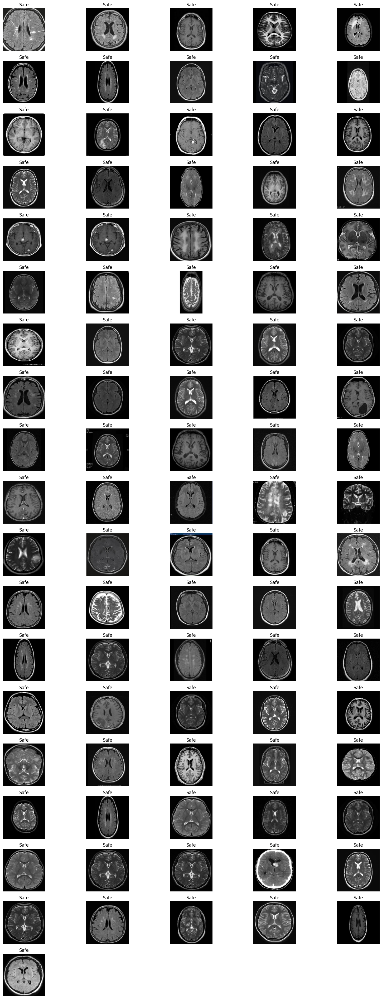

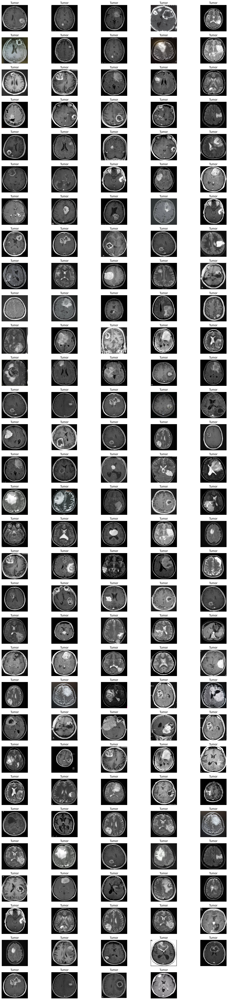

In [44]:
plot_all(benign, malignant)